AC/DC OPF Data
---

Make sure to install the required dependencies before running the notebook:

- torch
- h5py

This notebook is distributed alongside data that was generated using the AI4OPT/OPFGenerator repository. The data consists of several HDF5 files which contain input/solution data, and a JSON file which contains network information.

In [10]:
data_folder = "data/" # path to the folder containing the data files
case_ref = "14_ieee" # the case that you'd like to load

### Parsing functions

In [6]:
import torch
import h5py
import numpy as np


def parse_hdf5(path, preserve_shape=False):
    """Parse an HDF5 file into a dictionary.

    If `preserve_shape` is `True`, the dictionary will be structured
    to reflect the original structure of the HDF5 file. Otherwise, the
    dictionary will be flat where the keys are the paths to the data
    in the HDF5 file, e.g. d["primal"]["pg"] is under d["primal/pg"].

    Args:
        path (str): Path to the HDF5 file.
        preserve_shape (bool, optional): Whether to preserve the shape of the data. Defaults to False.

    Returns:
        dict: Dictionary containing the data from the HDF5 file.
    """
    dat = dict()

    def read_direct(dataset: h5py.Dataset):
        arr = np.empty(dataset.shape, dtype=dataset.dtype)

        if set(dataset.shape) != {0}:
            dataset.read_direct(arr)

        if arr.dtype.kind in "SO":
            return arr.astype(str)
        else:
            return torch.from_numpy(arr)

    def store(name, obj):
        if isinstance(obj, h5py.Group):
            return
        elif isinstance(obj, h5py.Dataset):
            dat[name] = read_direct(obj)
        else:
            raise ValueError(f"Got {type(obj)} under {name}.")

    with h5py.File(path, "r") as f:
        f.visititems(store)

    if preserve_shape:
        # recursively correct the shape of the dictionary
        ret = dict()

        def r_correct_shape(d: dict, ret: dict):
            for k in list(d.keys()):
                if "/" in k:
                    k1, k2 = k.split("/", 1)
                    if k1 not in ret:
                        ret[k1] = dict()
                    r_correct_shape({k2: d[k]}, ret[k1])
                    del d[k]
                else:
                    ret[k] = d[k]

        r_correct_shape(dat, ret)

        return ret
    else:
        return dat


In [7]:
import json

from pathlib import Path
from collections import defaultdict
from typing import Union, Sequence


class JSONParser:
    """
    This class provides PyTorch tensors given a path to a PowerModels Network Data JSON file.
    """

    def __init__(self, path: str):
        self.path = self.validate_path(path)

    def validate_path(self, path: str) -> Path:
        """Validate the path to the JSON file."""
        path_obj = Path(path).resolve()
        assert path_obj.name.endswith(
            (".json", ".json.gz", ".json.bz2")
        ), f"JSON Path {path_obj} does not have a .json, .json.gz, or .json.bz2 extension."

        if path_obj.exists():
            return path_obj
        else:
            if (gziped := path_obj.with_suffix(".json.gz")).exists():
                return gziped
            elif (bz2ed := path_obj.with_suffix(".json.bz2")).exists():
                return bz2ed
            else:
                raise FileNotFoundError(f"JSON Path {path_obj} does not exist.")

    def open(self):
        """Open the JSON file, supporting gzip and bz2 compression based on the file suffix."""

        if self.path.name.endswith(".json"):
            return open(self.path, "r")
        elif self.path.name.endswith(".json.gz"):
            import gzip

            return gzip.open(self.path, "rt")
        elif self.path.name.endswith(".json.bz2"):
            import bz2

            return bz2.open(self.path, "rt")
        else:
            raise ValueError("Unknown JSON file suffix: {}".format(self.path.name))  # pragma: no cover

    def parse(self, model_type: Union[str, Sequence[str]] = [], sanity_check: bool = True):
        """Parse the JSON file from OPFGenerator.

        Args:
            model_type (Union[str, Sequence[str]]): The reference solutions to save. Default: [] (no reference solutions saved.)
            sanity_check (bool): Whether to sanity check the data. Default: True.

        Returns:
            dict: Dictionary containing the parsed data.

        In the JSON file, the data is stored by each individual component.
        So to get generator 1's upper bound on active generation, you'd look at:
        raw_json['data']['gen']['1']['pmax'] and get a float.

        In the parsed version, we aggregate each of the components attributes into torch.Tensor arrays.
        So to get generator 1's upper bound on active generation, you'd look at:
        dat['gen']['pmax'][0] and get a float.
        Note that the index is 0-based and an integer, not 1-based and a string.

        To access the reference solution, pass a model_type (or multiple) and then use it as the key.
        """
        dat = dict()

        with self.open() as f:
            raw_json = json.load(f)
            file_data = raw_json["data"]
            dat["meta"] = raw_json["meta"]

            if isinstance(model_type, str):
                model_type = [model_type]

            for mtype in model_type:
                dat[mtype] = raw_json.get(mtype, None)
                if dat[mtype] is None:
                    print(f"Reference solution for model type {mtype} not found in JSON file.")

        if sanity_check:
            assert (
                len(set([tuple(sorted(list(file_data["bus"][i].keys()))) for i in file_data["bus"].keys()])) == 1
            ), "Bus keys are not the same for every bus."

            assert (
                len(set([tuple(sorted(list((file_data["gen"][i].keys())))) for i in file_data["gen"].keys()])) == 1
            ), "Generator keys are not the same for every generator."

            assert (
                len(set([tuple(sorted(list((file_data["branch"][i].keys())))) for i in file_data["branch"].keys()]))
                == 1
            ), "Branch keys are not the same for every branch."

            assert (
                len(set([tuple(sorted(list(file_data["shunt"][i].keys()))) for i in file_data["shunt"].keys()])) == 1
            ), "Shunt keys are not the same for every shunt."

            assert (
                len(set([tuple(sorted(list((file_data["load"][i].keys())))) for i in file_data["load"].keys()])) == 1
            ), "Load keys are not the same for every load."

        ## meta data
        for key in ["basic_network", "source_type", "name", "source_version", "baseMVA", "per_unit"]:
            dat[key] = file_data[key]

        ## components

        # bus
        dat["n_bus"] = len(file_data["bus"])
        dat["bus"] = defaultdict(list)
        print(f"Found {dat['n_bus']} buses.")
        """
        {'zone': 1, 'bus_i': 1, 'bus_type': 1, 'vmax': 1.06, 'source_id': ['bus', 1],
        'area': 1, 'vmin': 0.94, 'index': 1, 'va': 0.0, 'vm': 1.0, 'base_kv': 115.0}
        """
        for bus in sorted(file_data["bus"].keys(), key=int):
            if sanity_check:
                assert (
                    int(bus) == file_data["bus"][bus]["index"]
                ), f"Bus index {file_data['bus'][bus]['index']} is not the same as the bus number {bus}."

            for key, value in file_data["bus"][bus].items():
                if key in [
                    "vm",
                    "va",
                    "zone",
                    "area",
                    "bus_i",
                    "bus_type",
                    "index",
                    "vmin",
                    "vmax",
                    "base_kv",
                    "source_id",
                ]:
                    dat["bus"][key].append(value)
                else:
                    raise ValueError(f"Unknown bus key: {key} with value: {value}")  # pragma: no cover

            dat["bus"]["br_f"].append(
                [
                    branch["index"] - 1
                    for _, branch in sorted(file_data["branch"].items(), key=lambda x: int(x[0]))
                    if branch["f_bus"] == file_data["bus"][bus]["index"]
                ]
            )
            dat["bus"]["br_t"].append(
                [
                    branch["index"] - 1
                    for _, branch in sorted(file_data["branch"].items(), key=lambda x: int(x[0]))
                    if branch["t_bus"] == file_data["bus"][bus]["index"]
                ]
            )
            dat["bus"]["loads"].append(
                [
                    load["index"] - 1
                    for _, load in sorted(file_data["load"].items(), key=lambda x: int(x[0]))
                    if load["load_bus"] == file_data["bus"][bus]["index"]
                ]
            )
            dat["bus"]["shunts"].append(
                [
                    shunt["index"] - 1
                    for _, shunt in sorted(file_data["shunt"].items(), key=lambda x: int(x[0]))
                    if shunt["shunt_bus"] == file_data["bus"][bus]["index"]
                ]
            )
            dat["bus"]["gens"].append(
                [
                    gen["index"] - 1
                    for _, gen in sorted(file_data["gen"].items(), key=lambda x: int(x[0]))
                    if gen["gen_bus"] == file_data["bus"][bus]["index"]
                ]
            )

        if dat.get("dcline", False):
            raise ValueError("DC lines are not supported.")  # pragma: no cover

        # generator
        dat["n_gen"] = len(file_data["gen"])
        dat["gen"] = defaultdict(list)
        print(f"Found {dat['n_gen']} generators.")
        """
        {'pg': 0.0, 'model': 2, 'shutdown': 0.0, 'startup': 0.0, 'qg': 0.0,
        'gen_bus': 8, 'pmax': 0.0, 'vg': 1.0, 'mbase': 100.0, 'source_id': ['gen', 1], 'index': 1,
        'cost': [0.0, 0.0, 0.0], 'qmax': 0.1, 'gen_status': 1, 'qmin': -0.1, 'pmin': 0.0, 'ncost': 3}
        """
        for gen in sorted(file_data["gen"].keys(), key=int):
            if sanity_check:
                assert (
                    int(gen) == file_data["gen"][gen]["index"]
                ), f"Generator index {file_data['gen'][gen]['index']} is not the same as the generator number {gen}."

            for key, value in file_data["gen"][gen].items():
                if key in [
                    "pg",
                    "qg",
                    "vg",
                    "shutdown",
                    "startup",
                    "model",
                    "gen_status",
                    "index",
                    "pmin",
                    "pmax",
                    "qmin",
                    "qmax",
                    "mbase",
                    "ncost",
                    "cost",
                    "source_id",
                ]:
                    dat["gen"][key].append(value)
                elif key == "gen_bus":
                    dat["gen"][key].append(value - 1)
                else:
                    raise ValueError(f"Unknown gen key: {key} with value: {value}")  # pragma: no cover

        # branch
        dat["n_branch"] = len(file_data["branch"])
        dat["branch"] = defaultdict(list)
        print(f"Found {dat['n_branch']} branches.")
        """
        {'br_r': 6e-05, 'rate_a': 99.0, 'shift': 0.0, 'rate_b': 632.3,
        'br_x': 0.00046, 'rate_c': 632.3, 'g_to': 0.0, 'g_fr': 0.0, 'source_id': ['branch', 1],
        'b_fr': 0.0, 'f_bus': 31, 'br_status': 1, 't_bus': 266, 'b_to': 0.0, 'index': 1,
        'angmin': -0.5235987755982988, 'angmax': 0.5235987755982988, 'transformer': True, 'tap': 1.0082}
        """
        for branch in sorted(file_data["branch"].keys(), key=int):
            if sanity_check:
                assert (
                    int(branch) == file_data["branch"][branch]["index"]
                ), f"Branch index {file_data['branch'][branch]['index']} is not the same as the branch number {branch}."

            for key, value in file_data["branch"][branch].items():
                if key in [
                    "angmin",
                    "angmax",
                    # 'f_bus', 't_bus',
                    "transformer",
                    "br_status",
                    "index",
                    "br_r",
                    "br_x",
                    "g_fr",
                    "g_to",
                    "b_fr",
                    "b_to",
                    "rate_a",
                    "rate_b",
                    "rate_c",
                    "tap",
                    "shift",
                    "source_id",
                ]:
                    dat["branch"][key].append(value)
                elif key in ["f_bus", "t_bus"]:
                    dat["branch"][key].append(value - 1)
                else:
                    raise ValueError(f"Unknown branch key: {key} with value: {value}")  # pragma: no cover

        if dat.get("storage", False):
            raise ValueError("Storage is not supported.")  # pragma: no cover

        if dat.get("switch", False):
            raise ValueError("Switches are not supported.")  # pragma: no cover

        # shunt
        dat["n_shunt"] = len(file_data["shunt"])
        dat["shunt"] = defaultdict(list)
        print(f"Found {dat['n_shunt']} shunts.")
        """
        {'source_id': ['bus', 117], 'shunt_bus': 96, 'status': 1, 'gs': 0.0, 'bs': 3.25, 'index': 1}
        """
        for shunt in sorted(file_data["shunt"].keys(), key=int):
            if sanity_check:
                assert (
                    int(shunt) == file_data["shunt"][shunt]["index"]
                ), f"Shunt index {file_data['shunt'][shunt]['index']} is not the same as the shunt number {shunt}."

            for key, value in file_data["shunt"][shunt].items():
                if key in ["gs", "bs", "status", "index", "source_id"]:
                    dat["shunt"][key].append(value)
                elif key == "shunt_bus":
                    dat["shunt"][key].append(value - 1)
                else:
                    raise ValueError(f"Unknown shunt key: {key} with value: {value}")  # pragma: no cover

        dat["n_load"] = len(file_data["load"])
        dat["load"] = defaultdict(list)
        print(f"Found {dat['n_load']} loads.")
        """
        {'source_id': ['bus', 1], 'load_bus': 1, 'status': 1, 'qd': 0.49, 'pd': 0.9, 'index': 1}
        """
        for load in sorted(file_data["load"].keys(), key=int):
            if sanity_check:
                assert (
                    int(load) == file_data["load"][load]["index"]
                ), f"Load index {file_data['load'][load]['index']} is not the same as the load number {load}."

            for key, value in file_data["load"][load].items():
                if key in ["pd", "qd", "status", "index", "source_id"]:
                    dat["load"][key].append(value)
                elif key == "load_bus":
                    dat["load"][key].append(value - 1)
                else:
                    raise ValueError(f"Unknown load key: {key} with value: {value}")  # pragma: no cover

        # convert to tensors

        dat["bus"]["br_f"] = JSONParser.pad_to_dense(dat["bus"]["br_f"], padval=dat["n_branch"])
        print(f"Up to {dat['bus']['br_f'].shape[1]} branch from per bus.")

        dat["bus"]["br_t"] = JSONParser.pad_to_dense(dat["bus"]["br_t"], padval=dat["n_branch"])
        print(f"Up to {dat['bus']['br_t'].shape[1]} branch to per bus.")

        dat["bus"]["loads"] = JSONParser.pad_to_dense(dat["bus"]["loads"], padval=dat["n_load"])
        print(f"Up to {dat['bus']['loads'].shape[1]} load per bus.")

        dat["bus"]["shunts"] = JSONParser.pad_to_dense(dat["bus"]["shunts"], padval=dat["n_shunt"])
        print(f"Up to {dat['bus']['shunts'].shape[1]} shunt per bus.")

        dat["bus"]["gens"] = JSONParser.pad_to_dense(dat["bus"]["gens"], padval=dat["n_gen"])
        print(f"Up to {dat['bus']['gens'].shape[1]} gen per bus.")

        for component in ["bus", "gen", "branch", "shunt", "load"]:
            dat[component].default_factory = None  # disable defaultdict behavior

            for key, value in dat[component].items():
                if key != "source_id":
                    dat[component][key] = torch.from_numpy(
                        np.array(value)
                    )  # NOTE: values that got pad_to_dense above are already numpy arrays

            if sanity_check:
                assert all(
                    dat[component]["index"] == torch.arange(1, dat[f"n_{component}"] + 1)
                ), f"Index of {component} is not consistent!"
                assert (
                    len(set(c.shape[0] for c in dat[component].values() if isinstance(c, torch.Tensor))) == 1
                ), f"Lengths of {component} data are not consistent!"

        return dat

    @staticmethod
    def pad_to_dense(array, padval, dtype=int):
        """from https://codereview.stackexchange.com/questions/222623/pad-a-ragged-multidimensional-array-to-rectangular-shape"""

        def iterate_nested_array(array, index=()):
            try:
                for idx, row in enumerate(array):
                    yield from iterate_nested_array(row, (*index, idx))
            except TypeError:  # final level
                yield (*index, slice(len(array))), array

        def get_max_shape(array):
            def get_dimensions(array, level=0):
                yield level, len(array)
                try:
                    for row in array:
                        yield from get_dimensions(row, level + 1)
                except TypeError:  # not an iterable
                    pass

            dimensions = defaultdict(int)
            for level, length in get_dimensions(array):
                dimensions[level] = max(dimensions[level], length)
            return [value for _, value in sorted(dimensions.items())]

        dimensions = get_max_shape(array)
        result = np.full(dimensions, padval)
        for index, value in iterate_nested_array(array):
            result[index] = np.array(value)
        return result.astype(dtype)

def parse_json(path, **kwargs):
    return JSONParser(path).parse(**kwargs)

### Read data

In [11]:
from pathlib import Path

data_folder = Path(data_folder)
assert data_folder.exists(), f"Data folder not found: {data_folder}"
assert (data_folder / f"{case_ref}_input.h5").exists(), f"Input data file not found: {data_folder / f'{case_ref}_input.h5'}"
assert (data_folder / f"{case_ref}_ACOPF.h5").exists(), f"ACOPF data file not found: {data_folder / f'{case_ref}_ACOPF.h5'}"
assert (data_folder / f"{case_ref}_DCOPF.h5").exists(), f"DCOPF data file not found: {data_folder / f'{case_ref}_DCOPF.h5'}"
assert (data_folder / f"{case_ref}.ref.json").exists(), f"Reference data file not found: {data_folder / f'{case_ref}.ref.json'}"

AssertionError: Input data file not found: data/14_ieee_input.h5

In [8]:

D_input = parse_hdf5(data_folder / f"{case_ref}_input.h5", preserve_shape=True)
D_acp   = parse_hdf5(data_folder / f"{case_ref}_ACOPF.h5", preserve_shape=True)
D_dcp   = parse_hdf5(data_folder / f"{case_ref}_DCOPF.h5", preserve_shape=True)

ref_json = parse_json(data_folder / f"{case_ref}.ref.json", model_type=["ACOPF", "DCOPF"])

TypeError: unsupported operand type(s) for /: 'str' and 'str'

In [ ]:
D_input['data']['pd']

tensor([[0.2252, 1.0784, 0.4307,  ..., 0.0647, 0.1102, 0.1601],
        [0.2638, 0.9985, 0.4927,  ..., 0.0697, 0.1453, 0.1481],
        [0.1914, 0.8132, 0.4067,  ..., 0.0617, 0.1282, 0.1105],
        ...,
        [0.1787, 0.5116, 0.4727,  ..., 0.0642, 0.0945, 0.1149],
        [0.2023, 0.7963, 0.5062,  ..., 0.0576, 0.1690, 0.1386],
        [0.2489, 0.9261, 0.5873,  ..., 0.0641, 0.1329, 0.1841]],
       dtype=torch.float64)

In [ ]:
print(f"ACOPF infeasible: {(D_acp['meta']['termination_status'] != 'LOCALLY_SOLVED').sum()}")
print(f"DCOPF infeasible: {(D_dcp['meta']['termination_status'] != 'OPTIMAL').sum()}")
print(f"Total: {(D_acp['meta']['seed'].shape[0])}")

ACOPF infeasible: 1608
DCOPF infeasible: 0
Total: 20000


### Visualize data

First, let's visualize the input distribution. We will plot the cosine similarity of the active and reactive load vectors compared to the reference case in PGLib.

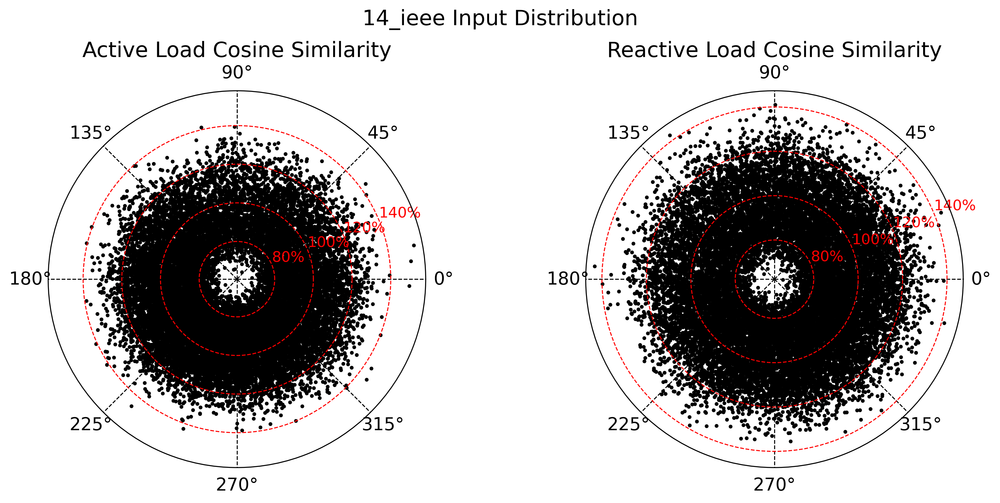

In [ ]:
import matplotlib.pyplot as plt, matplotlib.ticker as mtick

plt.rc('font', size=14)

fig, axs = plt.subplots(1, 2, figsize=(12,5), dpi=300, subplot_kw={'projection': 'polar'}, )

for ax, key, name in zip(axs, ["pd", "qd"], ["Active Load", "Reactive Load"]):
    ref_load = ref_json["load"][key]
    theta = torch.acos(torch.nn.functional.cosine_similarity(D_input["data"][key], ref_load)) * 180 / torch.pi
    ax.scatter(
        theta, D_input["data"][key].sum(dim=1) / ref_load.sum(),
        marker='.', edgecolor='none', color='black',
    )
    ax: plt.Axes
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
    ax.yaxis.set_major_locator(mtick.MultipleLocator(0.2))
    ax.yaxis.set_tick_params(labelcolor='red', labelsize='small')
    ax.grid(visible=True, which='major', axis='y', color='red', linestyle='--')
    ax.grid(visible=True, which='major', axis='x', color='black', linestyle='--', zorder=0)

    ax.set_title(f"{name} Cosine Similarity")

fig.subplots_adjust(left=0.3, right=0.7)
fig.suptitle("14_ieee Input Distribution", y=1.05)
fig.tight_layout();

In [ ]:
ac_infeasible = (D_acp['meta']['termination_status'] != 'LOCALLY_SOLVED') & (D_acp['meta']['primal_status'] != 'FEASIBLE_POINT') & (D_acp['meta']['dual_status'] != 'FEASIBLE_POINT')
ac_feasible = ~ac_infeasible

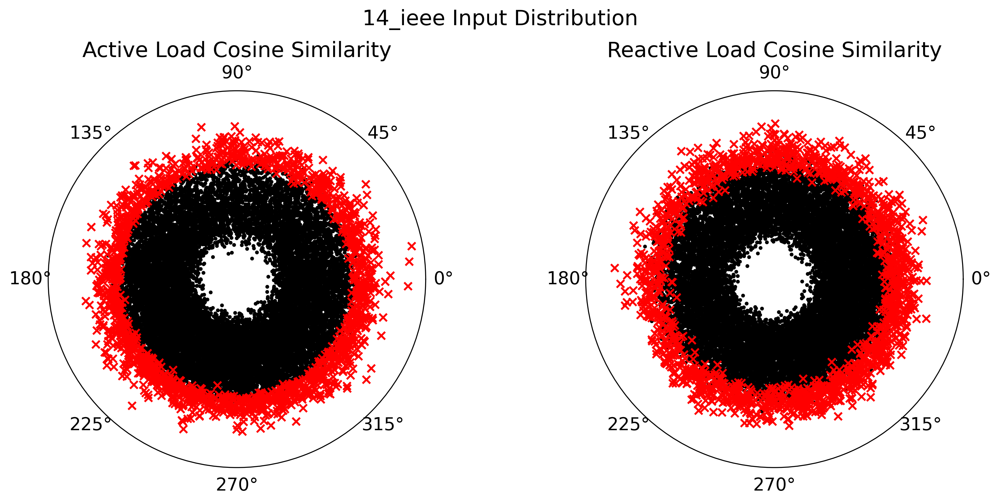

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(12,5), dpi=300, subplot_kw={'projection': 'polar'}, )

for ax, key, name in zip(axs, ["pd", "qd"], ["Active Load", "Reactive Load"]):
    ref_load = ref_json["load"][key]
    theta = torch.acos(torch.nn.functional.cosine_similarity(D_input["data"][key], ref_load)) * 180 / torch.pi
    ax.scatter(
        theta[ac_feasible], D_input["data"][key][ac_feasible].sum(dim=1) / ref_load.sum(),
        marker='.', edgecolor='none', color='black',
    )
    ax.scatter(
        theta[ac_infeasible], D_input["data"][key][ac_infeasible].sum(dim=1) / ref_load.sum(),
        marker='x', color='red',
    )
    ax.set_yticks([])
    ax.grid(False, axis='x')


    ax.set_title(f"{name} Cosine Similarity")
    ax.set_ylim(0.5, 1.6)
    

fig.subplots_adjust(left=0.3, right=0.7)
fig.suptitle("14_ieee Input Distribution", y=1.05)
fig.tight_layout();

Now let's take a look at the individual solutions, as a function of total (active) load.

In [ ]:
def acp_dcp_fig(total_load, ac_true, dc_true, ylabel, name, xmin=None, xmax=None, rows=2):
    import math

    n_components = ac_true.shape[1]

    cols = math.ceil(n_components / rows)
    fig, axs = plt.subplots(rows, cols, figsize=(cols * 7, 5 * rows), dpi=150)
    axs = axs.flatten()

    
    with torch.no_grad():
        for i in range(n_components):
            ax = axs[i]
            if dc_true is not None:
                ax.scatter(total_load[ac_feasible], dc_true[ac_feasible, i], alpha=0.5, label="DCOPF", color="black")
            if ac_true is not None:
                ax.scatter(total_load[ac_feasible], ac_true[ac_feasible, i], alpha=0.5, label="ACOPF", color="red")
            ax.set_xlabel("Total Load (p.u.)")
            ax.set_ylabel(ylabel)

            if xmin is not None:
                ax.axhline(y=xmin[i], color="black", linestyle="--", label="Bounds")
            if xmax is not None:
                ax.axhline(y=xmax[i], color="black", linestyle="--")

            ax.set_title(f"{name} {i}")
        
        axs[0].legend()
    fig.tight_layout()

    return fig, axs

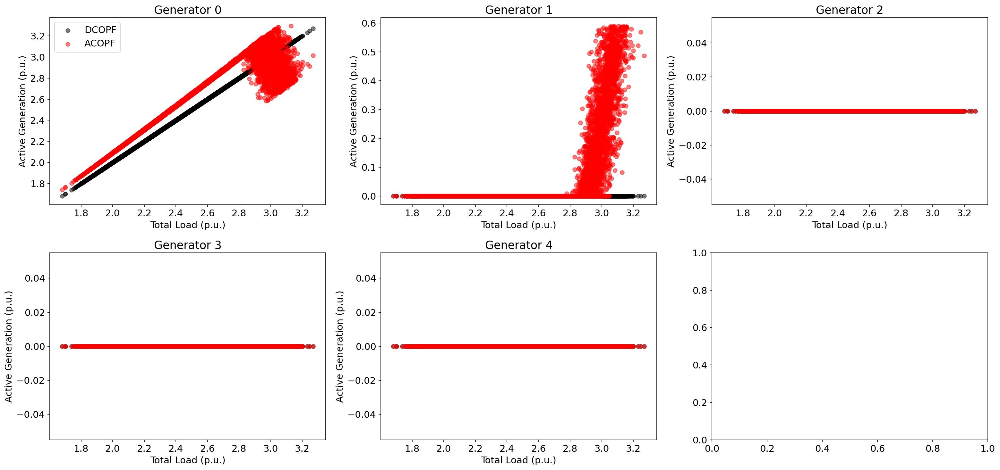

In [ ]:
acp_dcp_fig(
    D_input["data"]["pd"].sum(dim=1),
    D_acp["primal"]["pg"],
    D_dcp["primal"]["pg"],
    "Active Generation (p.u.)",
    "Generator",
    # ref_json["gen"]["pmin"],
    # ref_json["gen"]["pmax"],
);

DCOPF doesn't account for reactive power, so we only plot ACOPF's `qg` solutions. You may interpret DCOPF's `qg` as being fixed to zero.

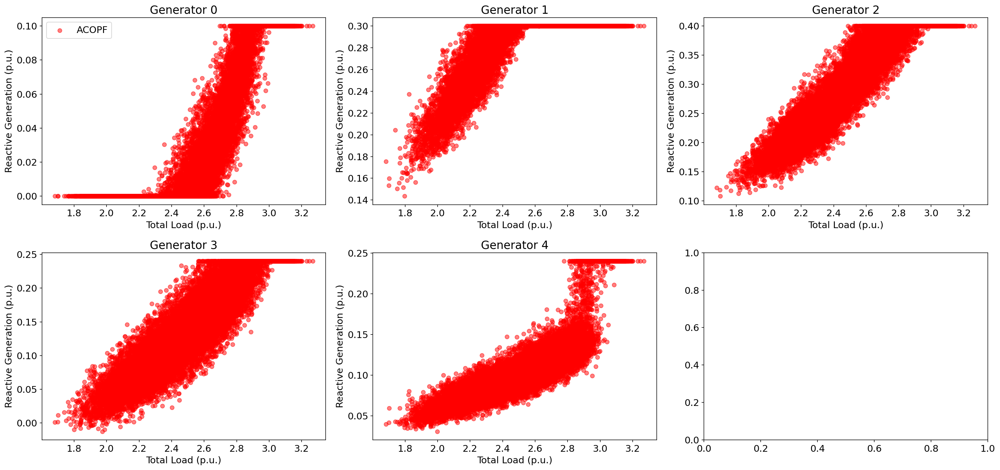

In [ ]:
acp_dcp_fig(
    D_input["data"]["pd"].sum(dim=1),
    D_acp["primal"]["qg"],
    None,
    "Reactive Generation (p.u.)",
    "Generator",
    # ref_json["gen"]["qmin"],
    # ref_json["gen"]["qmax"],
);

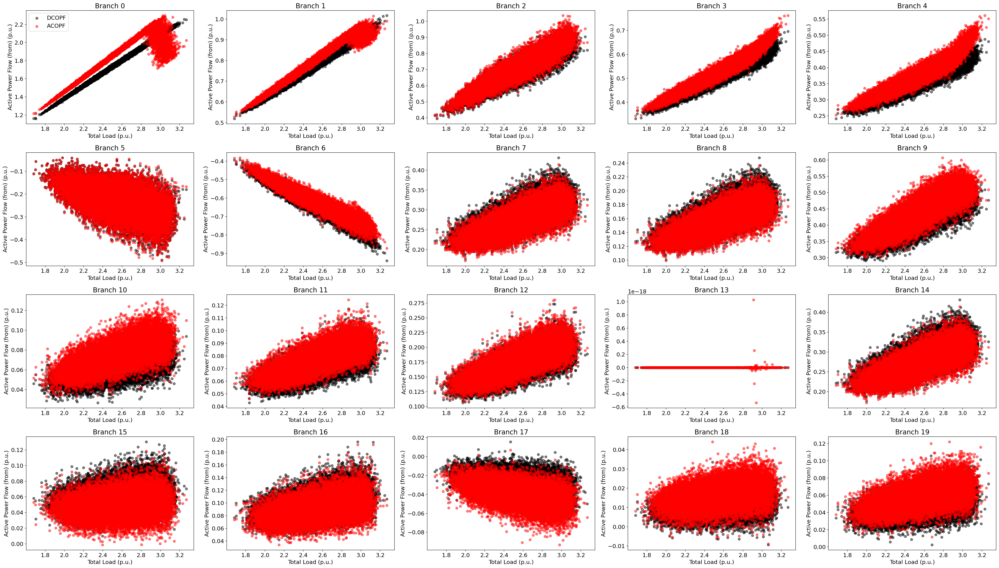

In [ ]:
acp_dcp_fig(
    D_input["data"]["pd"].sum(dim=1),
    D_acp["primal"]["pf"],
    D_dcp["primal"]["pf"],
    "Active Power Flow (from) (p.u.)",
    "Branch",
    rows=4,
    # -ref_json["branch"]["rate_a"],
    # ref_json["branch"]["rate_a"],
);

In DCOPF, power flows are only modeled in the "from" direction (the "to" direction is set like `pt = -pf`). The plot below compares ACOPF's `pt` to DCOPF's `-pf`.

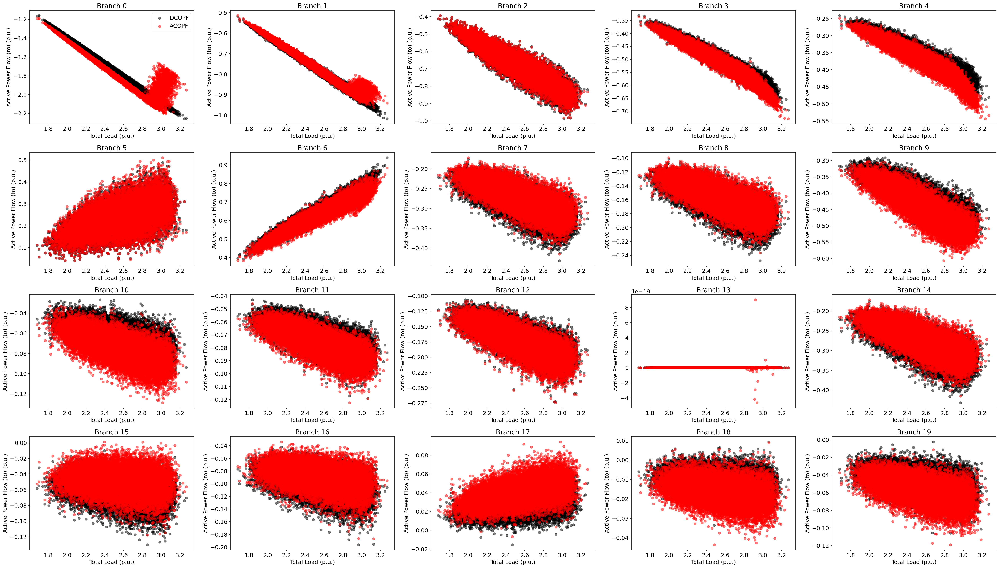

In [ ]:
acp_dcp_fig(
    D_input["data"]["pd"].sum(dim=1),
    D_acp["primal"]["pt"],
    -D_dcp["primal"]["pf"],
    "Active Power Flow (to) (p.u.)",
    "Branch",
    rows=4,
    # -ref_json["branch"]["rate_a"],
    # ref_json["branch"]["rate_a"],
);

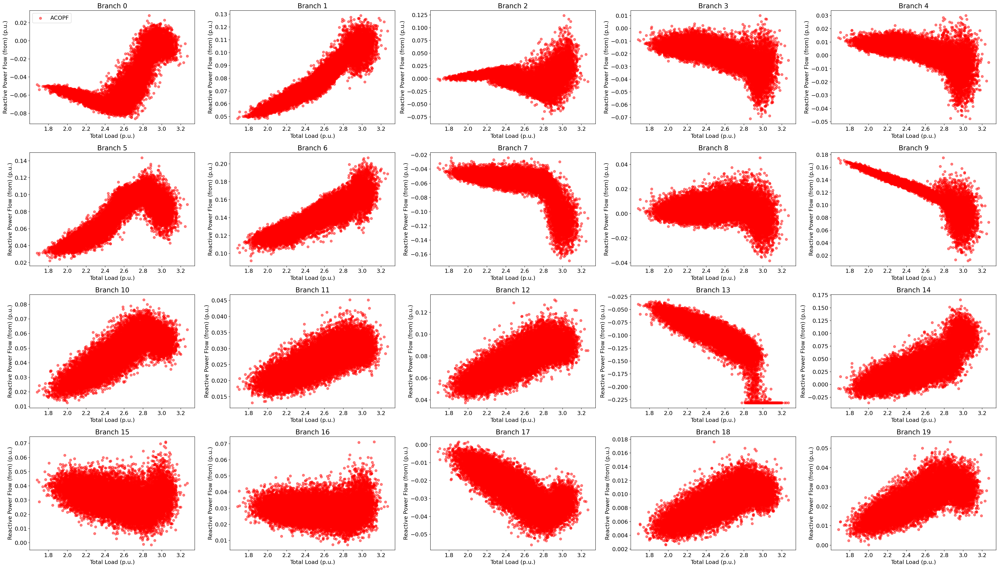

In [ ]:
acp_dcp_fig(
    D_input["data"]["pd"].sum(dim=1),
    D_acp["primal"]["qf"],
    None,
    "Reactive Power Flow (from) (p.u.)",
    "Branch",
    rows=4,
);

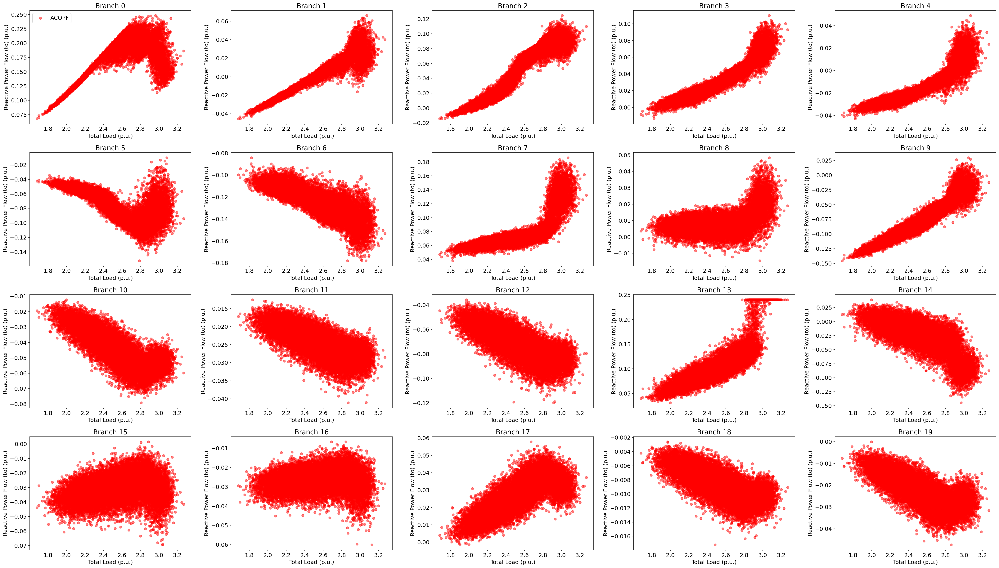

In [ ]:
acp_dcp_fig(
    D_input["data"]["pd"].sum(dim=1),
    D_acp["primal"]["qt"],
    None,
    "Reactive Power Flow (to) (p.u.)",
    "Branch",
    rows=4,
);